# MultiModal Variantional AutoEncoder

This notebook trains a multi-modal Variational Autoencoder (mVAE) that learns to connect brushstroke images with their corresponding 3D motion trajectories. <br>
It aims to generate realistic motion sequences (X, Y, Z) that could be executed by a robot, based on the appearance of a brushstroke. <br>

### Usage<br>
Place your data:<br>
dataset generation/img/ → brushstroke images<br>
dataset generation/filtered_outputs/ → motion CSVs<br>

Run the notebook sequentially:<br>
Train the model<br>
Visualize latent space and predictions<br>

Check output folders:
csv_outputs_results/ → generated motion trajectories<br>
result_pred_imgs/ → visual comparison plots<br>
*.pth → saved model weights<br>

## Import Libraries

In [1]:
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader, random_split
from torchvision import transforms

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import glob
from PIL import Image
from tqdm import tqdm


## Dataset

Data Loading & Preprocessing <br>
Loads paired data: brushstroke images (.png) and motion trajectories (.csv).<br>
Motion data normalized from millimeters to meters.<br>
Custom collate function pads sequences to handle variable-length trajectories.

In [ ]:
class BrushStrokeMotionDataset(Dataset):
    def __init__(self, image_dir, motion_dir, transform=None):

        # read and sort the files
        self.image_paths = sorted(glob.glob(image_dir + "*.png"))  
        self.motion_paths = sorted(glob.glob(motion_dir + "*.csv"))

        assert len(self.image_paths) == len(self.motion_paths)

        self.transform = transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        # read img
        img = Image.open(self.image_paths[idx]).convert("RGB")
        if self.transform:
            img = self.transform(img)

        # read motion CSV, only XYZ
        df = pd.read_csv(self.motion_paths[idx])
        motion = df[['X_mm','Y_mm','Z_mm']].dropna().values.astype(float)
        motion = motion / 1000  # mm -> m
        length = motion.shape[0]


        return img, motion, length

def collate_fn(batch):
    imgs, motions, lengths = zip(*batch)
    imgs = torch.stack([transforms.ToTensor()(i) if not isinstance(i, torch.Tensor) else i for i in imgs])
    lengths = torch.tensor(lengths)
    max_len = max(lengths)
    padded_motions = torch.zeros(len(motions), max_len, 3)
    for i, m in enumerate(motions):
        padded_motions[i,:m.shape[0],:] = torch.tensor(m)
    return imgs, padded_motions, lengths

# transform
transform = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.05),
    transforms.ToTensor()
])

## Model Architecture
Encoder (Image → Latent Space) <br>
A pretrained DINOv2 Vision Transformer (ViT-S/14) encodes brushstroke images into a compact latent representation.<br>

Decoder (Latent → Motion)<br>
An LSTM-based decoder generates continuous XYZ motion sequences conditioned on the latent code.<br>

VAE Framework<br>
The encoder outputs both a mean and variance, allowing the model to sample latent vectors and generalize better.

In [ ]:
class ImageEncoder(nn.Module):
    def __init__(self, latent_dim=128):
        super().__init__()
        self.dino = torch.hub.load("facebookresearch/dinov2", "dinov2_vits14")
        self.dino.eval()
        for p in self.dino.parameters():
            p.requires_grad = False
        self.fc_mu = nn.Linear(384, latent_dim)
        self.fc_logvar = nn.Linear(384, latent_dim)

    def forward(self, x):
        with torch.no_grad():
            feat = self.dino(x)
        mu = self.fc_mu(feat)
        logvar = self.fc_logvar(feat)
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        z = mu + eps * std
        return z, mu, logvar

class MotionEncoder(nn.Module):
    def __init__(self, latent_dim=128, hidden_dim=512, num_joints=3, num_layers=2):
        super().__init__()
        self.lstm = nn.LSTM(input_size=num_joints, hidden_size=hidden_dim,
                            num_layers=num_layers, batch_first=True)
        self.fc_mu = nn.Linear(hidden_dim, latent_dim)
        self.fc_logvar = nn.Linear(hidden_dim, latent_dim)

    def forward(self, motion, lengths):
        packed = nn.utils.rnn.pack_padded_sequence(motion, lengths.cpu(), batch_first=True, enforce_sorted=False)
        _, (h, _) = self.lstm(packed)
        h = h[-1]  # last layer hidden
        mu = self.fc_mu(h)
        logvar = self.fc_logvar(h)
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        z = mu + eps * std
        return z, mu, logvar

class ImageDecoder(nn.Module):
    def __init__(self, latent_dim=128, output_channels=3, base_channels=64, image_size=224):
        super().__init__()
        self.latent_dim = latent_dim
        self.base_channels = base_channels
        self.image_size = image_size
        self.spatial_dim = image_size // 16  # latent projection

        # Project latent vector to spatial feature map
        self.fc = nn.Linear(latent_dim, base_channels * 8 * self.spatial_dim * self.spatial_dim)

        # Upsampling blocks with skip connections style
        def conv_block(in_ch, out_ch):
            return nn.Sequential(
                nn.Conv2d(in_ch, out_ch, 3, padding=1),
                nn.BatchNorm2d(out_ch),
                nn.ReLU(inplace=True)
            )

        self.up1 = nn.ConvTranspose2d(base_channels * 8, base_channels * 4, 4, 2, 1)
        self.conv1 = conv_block(base_channels * 4, base_channels * 4)

        self.up2 = nn.ConvTranspose2d(base_channels * 4, base_channels * 2, 4, 2, 1)
        self.conv2 = conv_block(base_channels * 2, base_channels * 2)

        self.up3 = nn.ConvTranspose2d(base_channels * 2, base_channels, 4, 2, 1)
        self.conv3 = conv_block(base_channels, base_channels)

        self.up4 = nn.ConvTranspose2d(base_channels, output_channels, 4, 2, 1)
        # Output in [-1,1] for normalized images
        self.tanh = nn.Tanh()

    def forward(self, z):
        h = self.fc(z)
        h = h.view(z.size(0), self.base_channels * 8, self.spatial_dim, self.spatial_dim)

        h = self.up1(h)
        h = self.conv1(h)

        h = self.up2(h)
        h = self.conv2(h)

        h = self.up3(h)
        h = self.conv3(h)

        h = self.up4(h)
        return self.tanh(h)

class MotionDecoder(nn.Module):
    def __init__(self, latent_dim=128, hidden_dim=512, num_joints=3, seq_len=75, num_layers=2):
        super().__init__()
        self.seq_len = seq_len
        self.num_layers = num_layers
        self.hidden_dim = hidden_dim
        self.num_joints = num_joints

        # latent remap hidden & cell
        self.init_fc_h = nn.Linear(latent_dim, hidden_dim)
        self.init_fc_c = nn.Linear(latent_dim, hidden_dim)

        # LSTM input latent_dim, output hidden_dim
        self.lstm = nn.LSTM(
            input_size=latent_dim,
            hidden_size=hidden_dim,
            num_layers=num_layers,
            batch_first=True
        )

        # hidden_dim remap to output of joint
        self.output_fc = nn.Linear(hidden_dim, num_joints)

    def forward(self, z, seq_len=None):
        if seq_len is None:
            seq_len = self.seq_len
        repeated_z = z.unsqueeze(1).repeat(1, seq_len, 1)

        h0 = torch.tanh(self.init_fc_h(z)).unsqueeze(0).repeat(self.num_layers, 1, 1)
        c0 = torch.tanh(self.init_fc_c(z)).unsqueeze(0).repeat(self.num_layers, 1, 1)

        outputs, _ = self.lstm(repeated_z, (h0, c0))
        trajectories = self.output_fc(outputs)
        return trajectories

class MultiModalVAE(nn.Module):
    def __init__(self, latent_dim=128):
        super().__init__()
        self.img_enc = ImageEncoder(latent_dim)
        self.img_dec = ImageDecoder(latent_dim)
        self.motion_enc = MotionEncoder(latent_dim)
        self.motion_dec = MotionDecoder(latent_dim)

    def forward(self, images, motions, lengths):
        # Image VAE
        z_img, mu_img, logvar_img = self.img_enc(images)
        recon_img = self.img_dec(z_img)
        # Motion VAE
        z_mot, mu_mot, logvar_mot = self.motion_enc(motions, lengths)
        recon_mot = self.motion_dec(z_mot, seq_len=motions.size(1))
        return recon_img, recon_mot, mu_img, logvar_img, mu_mot, logvar_mot

## Config

In [ ]:
config = {
    "batch_size": 128,
    "latent_dim": 256,
    "lr": 1e-3,
    "num_epochs": 200,
    "train_val_split": 0.8
}

device = 'cuda' if torch.cuda.is_available() else 'cpu'

model = MultiModalVAE(config["latent_dim"]).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
criterion = nn.MSELoss(reduction='none')

dataset = BrushStrokeMotionDataset(
    image_dir="data_img/",
    motion_dir="data_motion/",
    transform=transform
)

train_size = int(len(dataset) * config["train_val_split"])
val_size = len(dataset) - train_size
train_dataset, val_dataset = random_split(dataset, [train_size, val_size])
patience = 40


train_loader = DataLoader(train_dataset, batch_size=config["batch_size"], shuffle=True, collate_fn=collate_fn)
val_loader = DataLoader(val_dataset, batch_size=config["batch_size"], shuffle=False, collate_fn=collate_fn)
save_path = "image2motion_best.pth"


Using cache found in C:\Users\ellen/.cache\torch\hub\facebookresearch_dinov2_main
C:\Users\ellen/.cache\torch\hub\facebookresearch_dinov2_main\dinov2\layers\swiglu_ffn.py:51: UserWarning: xFormers is not available (SwiGLU)
  warnings.warn("xFormers is not available (SwiGLU)")
C:\Users\ellen/.cache\torch\hub\facebookresearch_dinov2_main\dinov2\layers\attention.py:33: UserWarning: xFormers is not available (Attention)
  warnings.warn("xFormers is not available (Attention)")
C:\Users\ellen/.cache\torch\hub\facebookresearch_dinov2_main\dinov2\layers\block.py:40: UserWarning: xFormers is not available (Block)
  warnings.warn("xFormers is not available (Block)")


## Loss Function
Loss = Reconstruction Loss (MSE) + KLD (KL divergence) + Smoothness regularization <br>
with Product of Experts <br>

In [ ]:
import torch
import torch.nn as nn

criterion = nn.MSELoss(reduction='mean')

def poe(mu_list, logvar_list):
    """
    Product of Experts for Gaussian distributions.
    Given lists of means and log-variances from multiple experts (modalities),
    returns the combined mean and log-variance.
    """
    var_list = [torch.exp(lv) for lv in logvar_list]
    precision_list = [1.0 / v for v in var_list]
    
    precision_sum = torch.stack(precision_list).sum(dim=0)
    mu = torch.stack([m * p for m, p in zip(mu_list, precision_list)]).sum(dim=0) / precision_sum
    logvar = torch.log(1.0 / precision_sum)
    return mu, logvar


def vae_loss(recon_img, images, recon_mot, motions, lengths,
             mu_img, logvar_img, mu_mot, logvar_mot,
             criterion_img=nn.MSELoss(), criterion_mot=None, smooth_weight=0.1):
    """
    Multimodal VAE loss with Product of Experts (PoE) latent fusion.

    Args:
        recon_img: reconstructed images from VAE
        images: ground truth images
        recon_mot: reconstructed motions from VAE
        motions: ground truth motion sequences
        lengths: sequence lengths (for variable-length motion)
        mu_img, logvar_img: image latent distribution parameters
        mu_mot, logvar_mot: motion latent distribution parameters
        criterion_img: reconstruction loss for images (default MSE)
        criterion_mot: reconstruction loss for motions (default MSE)
        smooth_weight: weight for motion smoothness regularization
    """
    if criterion_mot is None:
        criterion_mot = nn.MSELoss()

    # Reconstruction Loss
    recon_loss_img = criterion_img(recon_img, images)
    recon_loss_mot = criterion_mot(recon_mot, motions)

    # Optional smoothness term: penalize motion velocity change
    # (encourages smooth temporal transitions)
    diff = motions[:, 1:, :] - motions[:, :-1, :]
    smooth_loss = (diff ** 2).mean()

    # PoE Fusion
    mu_joint, logvar_joint = poe([mu_img, mu_mot], [logvar_img, logvar_mot])

    # KL Divergence
    def kl_divergence(mu, logvar):
        # KL between q(z|x) and N(0, I)
        return -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp(), dim=1).mean()

    kl_img = kl_divergence(mu_img, logvar_img)
    kl_mot = kl_divergence(mu_mot, logvar_mot)
    kl_joint = kl_divergence(mu_joint, logvar_joint)

    kl_total = (kl_img + kl_mot + kl_joint) / 3.0

    # total loss
    total_loss = recon_loss_img + recon_loss_mot + kl_total + smooth_weight * smooth_loss

    return total_loss, {
        "recon_img": recon_loss_img.item(),
        "recon_mot": recon_loss_mot.item(),
        "kl_img": kl_img.item(),
        "kl_mot": kl_mot.item(),
        "kl_joint": kl_joint.item(),
        "smooth": smooth_loss.item(),
        "total": total_loss.item(),
    }

## Plot of Prediction

In [ ]:
import os

def plot_reconstructions_mVAE(model, data_loader, epoch, device='cuda', save_dir="csv_outputs_results_copy"):
    os.makedirs(save_dir, exist_ok=True)
    model.eval()

    with torch.no_grad():
        images, motions, lengths = next(iter(data_loader))
        images, motions, lengths = images.to(device), motions.to(device), lengths.to(device)

        # forward through multimodal VAE
        recon_img, recon_mot, mu_img, logvar_img, mu_mot, logvar_mot = model(images, motions, lengths)

        num_samples = min(5, images.size(0))
        fig = plt.figure(figsize=(20, 6))

        for i in range(num_samples):
            T = lengths[i].item()

            # Convert to numpy (mm)
            pred_xyz = recon_mot[i, :T, :].cpu().numpy() * 1000
            gt_xyz   = motions[i, :T, :].cpu().numpy() * 1000

            # Save to CSV
            # pred_df = pd.DataFrame(pred_xyz, columns=["X_mm", "Y_mm", "Z_mm"])
            # gt_df = pd.DataFrame(gt_xyz, columns=["X_mm", "Y_mm", "Z_mm"])
            # pred_path = os.path.join(save_dir, f"pred_{i}.csv")
            # gt_path = os.path.join(save_dir, f"gt_{i}.csv")
            #pred_df.to_csv(pred_path, index=False)
            #gt_df.to_csv(gt_path, index=False)

            # Top row: original & reconstructed image
            ax_img = fig.add_subplot(3, num_samples, i + 1)
            ax_img.imshow(images[i].cpu().permute(1, 2, 0).numpy())
            ax_img.axis('off')
            ax_img.set_title(f"Original {i}", fontsize=10)

            ax_recon = fig.add_subplot(3, num_samples, num_samples + i + 1)
            recon_imgShow = recon_img[i].cpu().permute(1, 2, 0).numpy()
            img_show = (recon_imgShow + 1.0) / 2.0 
            ax_recon.imshow(img_show)
            ax_recon.axis('off')
            ax_recon.set_title("Reconstructed", fontsize=10)

            # Bottom row: 3D motion plot
            ax_3d = fig.add_subplot(3, num_samples, 2 * num_samples + i + 1, projection='3d')
            ax_3d.plot(pred_xyz[:,0], pred_xyz[:,1], pred_xyz[:,2], 'r', label='Pred')
            ax_3d.plot(gt_xyz[:,0], gt_xyz[:,1], gt_xyz[:,2], 'b', label='GT')
            ax_3d.set_xlabel('X'); ax_3d.set_ylabel('Y'); ax_3d.set_zlabel('Z')
            ax_3d.view_init(elev=30, azim=-60)
            if i == 0:
                ax_3d.legend(fontsize=8)
            # Fix the viewing range (grid boundary)
            # ax_3d.set_xlim(12, 102)
            # ax_3d.set_ylim(-660, -570)
            # # You can leave Z free or fix manually
            # ax_3d.set_zlim(0, 15)

            # print(f"💾 Saved: {pred_path}, {gt_path}")
        
        img_save_path = f"{save_dir}epoch_{epoch}.png"
        plt.tight_layout()
        plt.savefig(img_save_path, bbox_inches='tight')
        plt.show()

## Main Train Loop

Epoch 1/200 [Train]:   0%|          | 0/32 [00:00<?, ?it/s]

Epoch 1/200 [Val]: 100%|██████████| 8/8 [00:42<00:00,  5.26s/it]


Epoch 1/200: Train=107.9879, Val=45.6550 --> best model saved


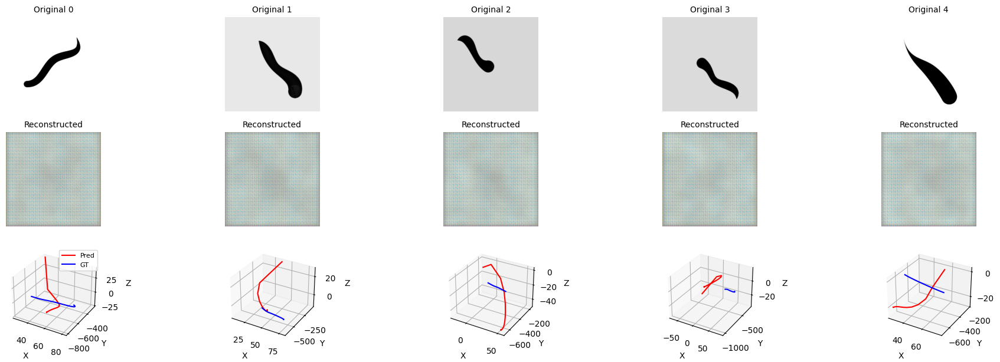

Epoch 2/200 [Val]: 100%|██████████| 8/8 [00:14<00:00,  1.79s/it]


Epoch 2/200: Train=35.5847, Val=28.5929 --> best model saved


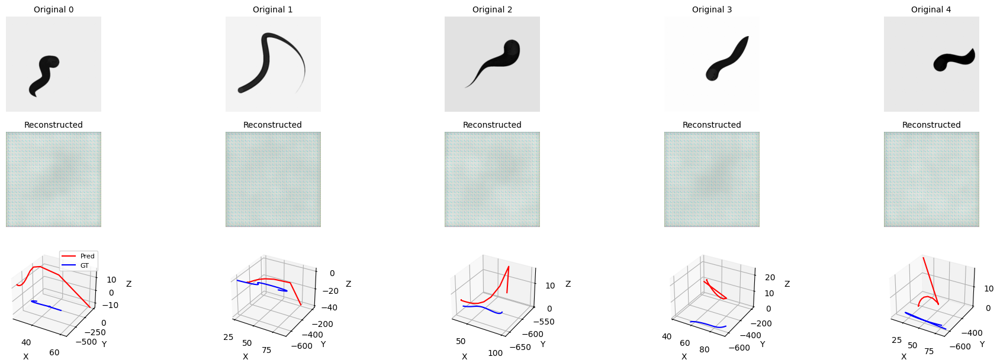

Epoch 3/200 [Val]: 100%|██████████| 8/8 [00:16<00:00,  2.01s/it]


Epoch 3/200: Train=26.0473, Val=23.1875 --> best model saved


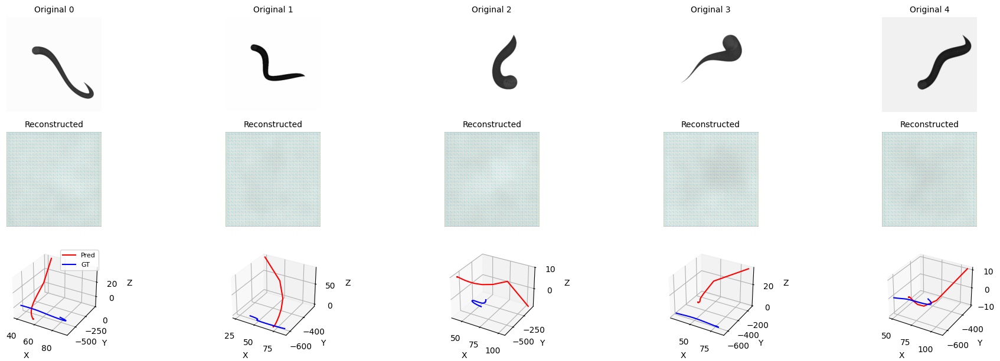

Epoch 4/200 [Val]: 100%|██████████| 8/8 [00:17<00:00,  2.20s/it]


Epoch 4/200: Train=21.9487, Val=20.2661 --> best model saved


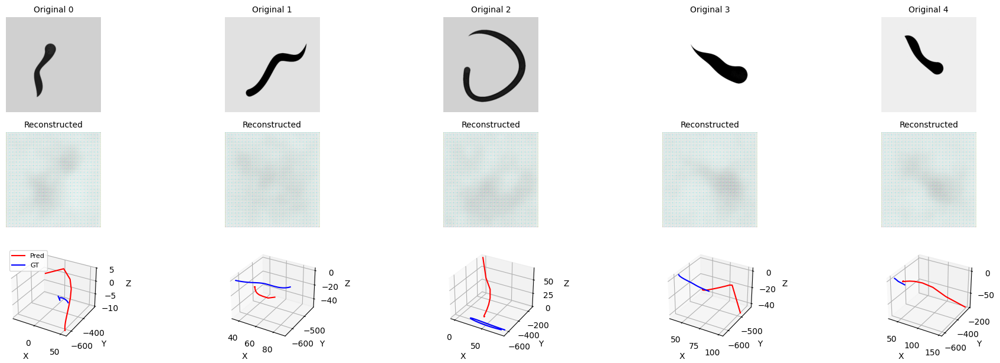

Epoch 5/200 [Val]: 100%|██████████| 8/8 [00:19<00:00,  2.38s/it]


Epoch 5/200: Train=19.4801, Val=18.2517 --> best model saved


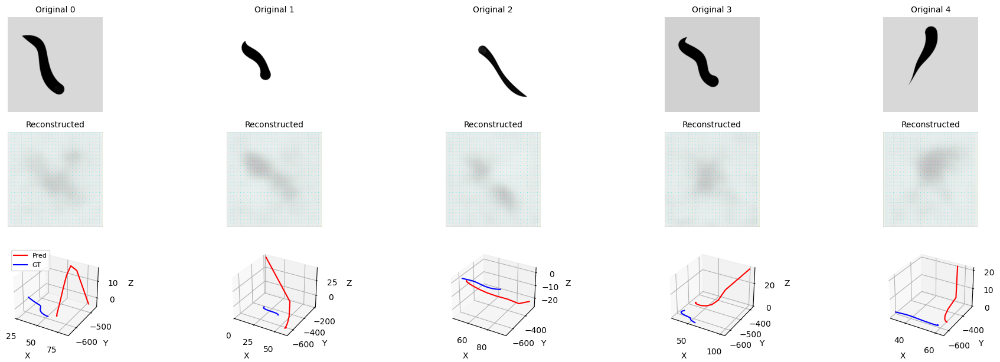

Epoch 6/200 [Val]: 100%|██████████| 8/8 [00:19<00:00,  2.42s/it]


Epoch 6/200: Train=17.7076, Val=16.7203 --> best model saved


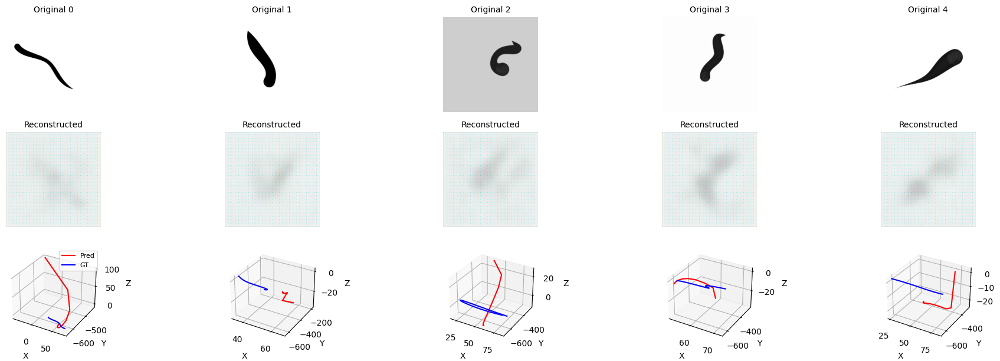

Epoch 7/200 [Val]: 100%|██████████| 8/8 [00:20<00:00,  2.55s/it]


Epoch 7/200: Train=16.4365, Val=15.6390 --> best model saved


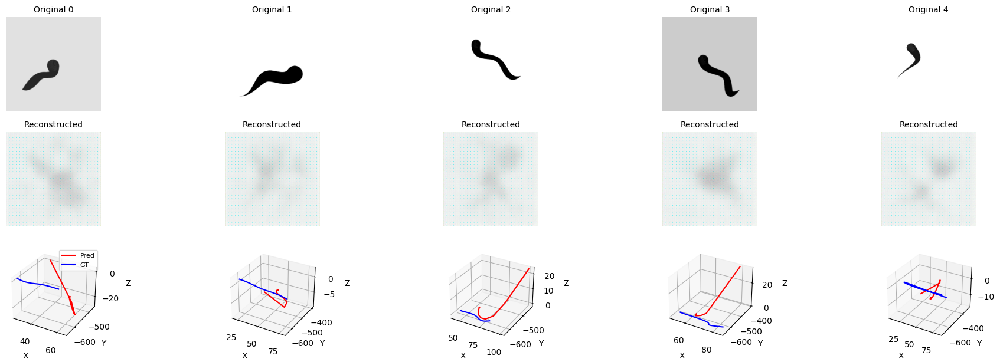

Epoch 8/200 [Val]: 100%|██████████| 8/8 [00:22<00:00,  2.80s/it]


Epoch 8/200: Train=15.4387, Val=14.9910 --> best model saved


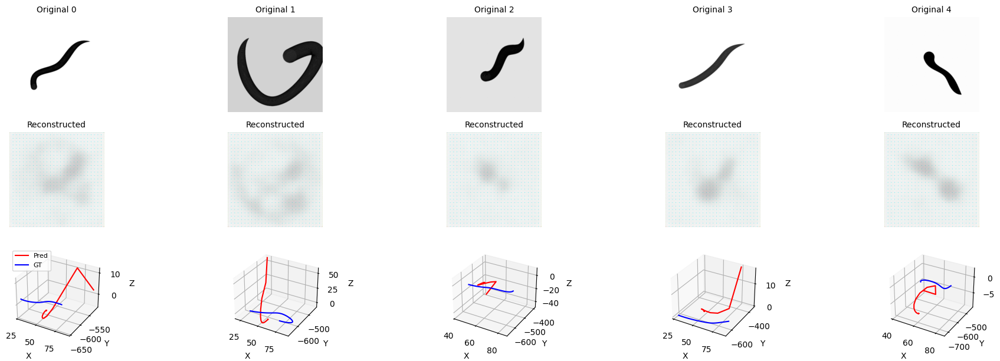

Epoch 9/200 [Val]: 100%|██████████| 8/8 [00:20<00:00,  2.58s/it]


Epoch 9/200: Train=14.6802, Val=14.1950 --> best model saved


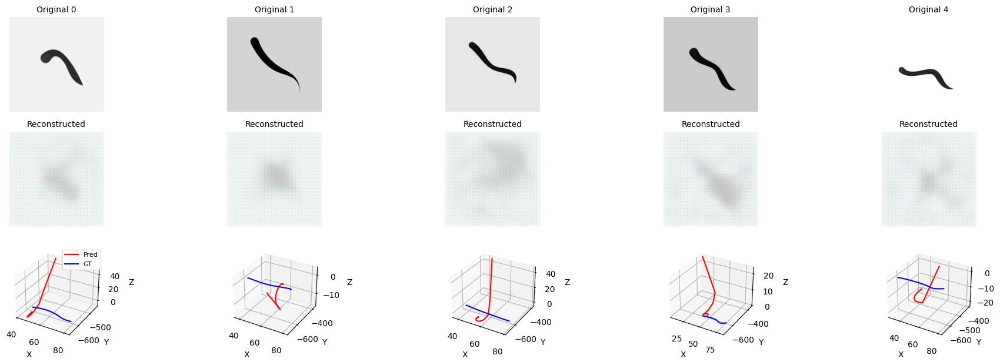

Epoch 10/200 [Val]: 100%|██████████| 8/8 [00:21<00:00,  2.72s/it]


Epoch 10/200: Train=14.0242, Val=13.6249 --> best model saved


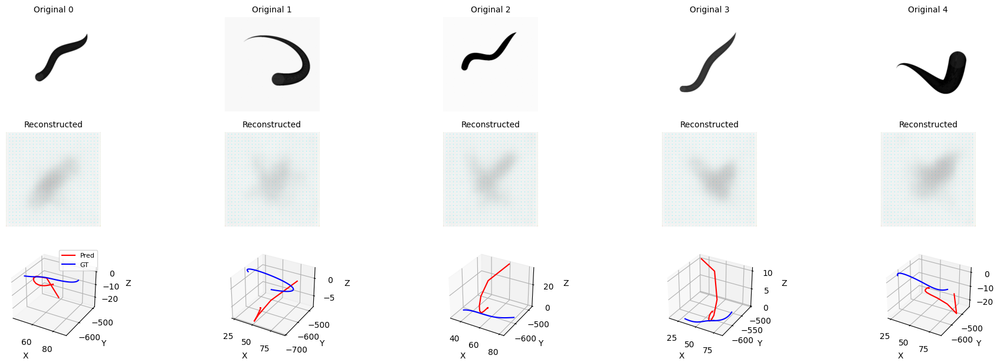

Epoch 11/200 [Val]: 100%|██████████| 8/8 [00:22<00:00,  2.77s/it]


Epoch 11/200: Train=13.4915, Val=13.0964 --> best model saved


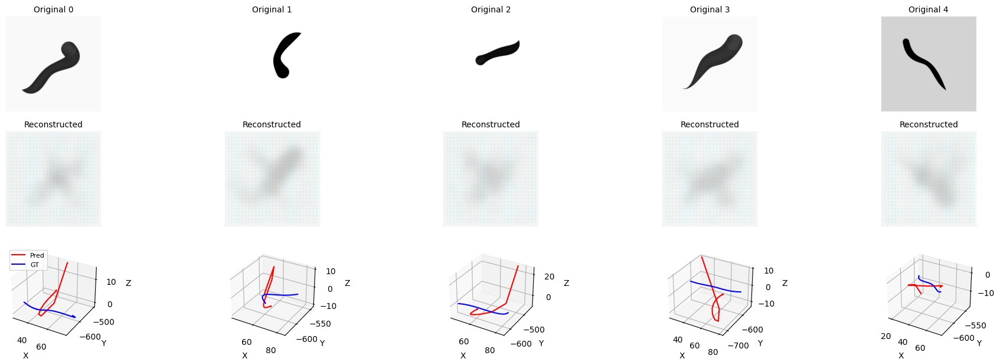

Epoch 12/200 [Val]: 100%|██████████| 8/8 [00:25<00:00,  3.18s/it]


Epoch 12/200: Train=13.0463, Val=12.7544 --> best model saved


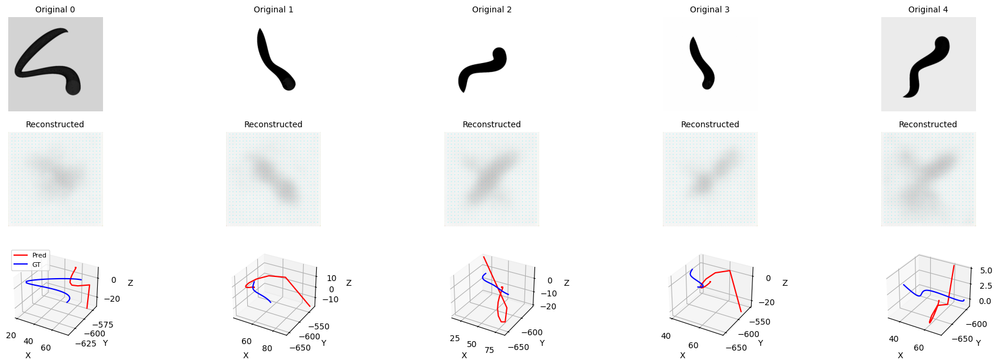

Epoch 13/200 [Val]: 100%|██████████| 8/8 [00:23<00:00,  2.97s/it]


Epoch 13/200: Train=12.5765, Val=12.3413 --> best model saved


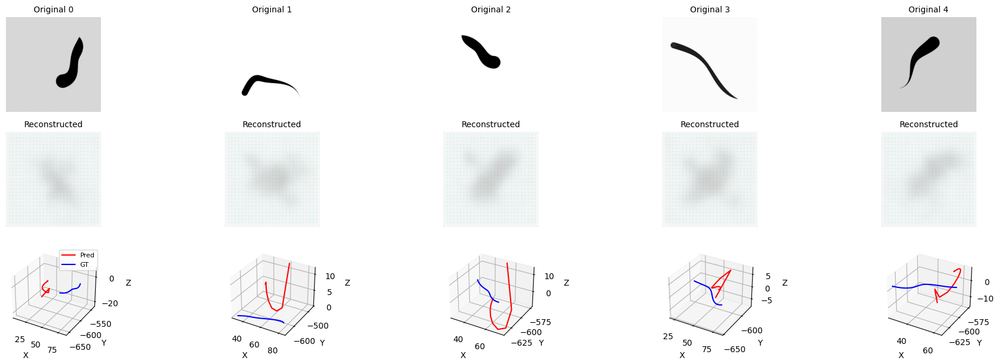

Epoch 14/200 [Val]: 100%|██████████| 8/8 [00:24<00:00,  3.05s/it]


Epoch 14/200: Train=12.2754, Val=12.0875 --> best model saved


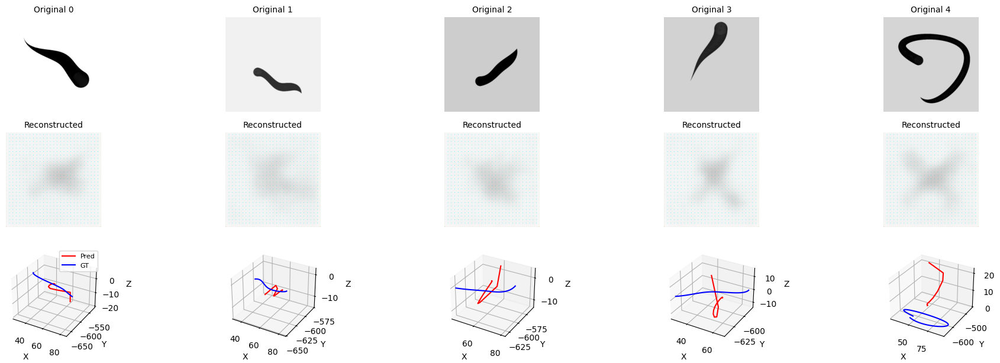

Epoch 15/200 [Val]: 100%|██████████| 8/8 [00:24<00:00,  3.06s/it]


Epoch 15/200: Train=11.9461, Val=11.7122 --> best model saved


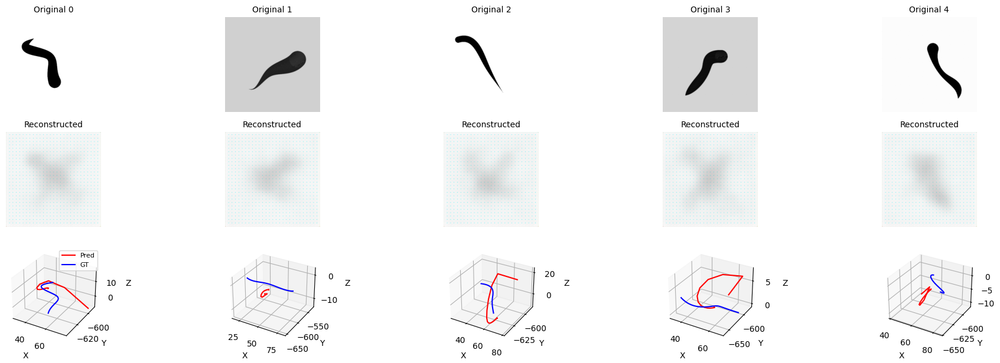

Epoch 16/200 [Val]: 100%|██████████| 8/8 [00:24<00:00,  3.03s/it]


Epoch 16/200: Train=11.6590, Val=11.4361 --> best model saved


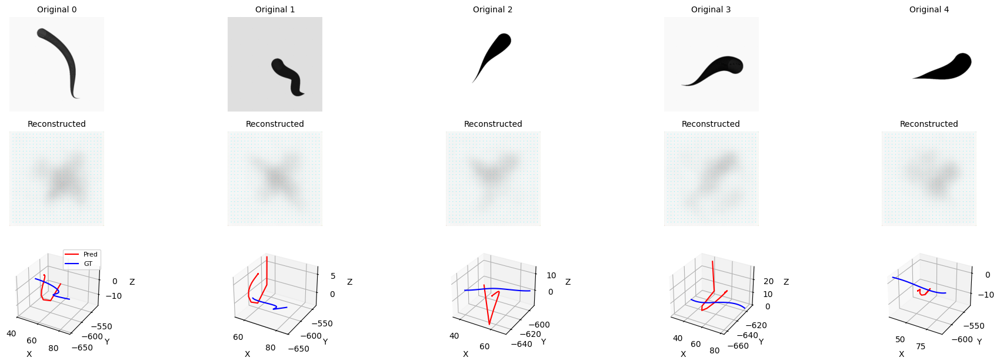

Epoch 17/200 [Val]: 100%|██████████| 8/8 [00:23<00:00,  2.96s/it]


Epoch 17/200: Train=11.4000, Val=11.2753 --> best model saved


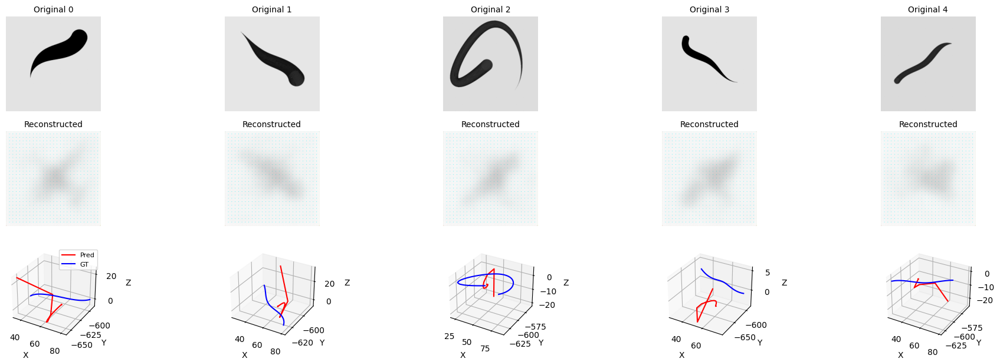

Epoch 18/200 [Val]: 100%|██████████| 8/8 [00:23<00:00,  2.92s/it]


Epoch 18/200: Train=11.1380, Val=11.0054 --> best model saved


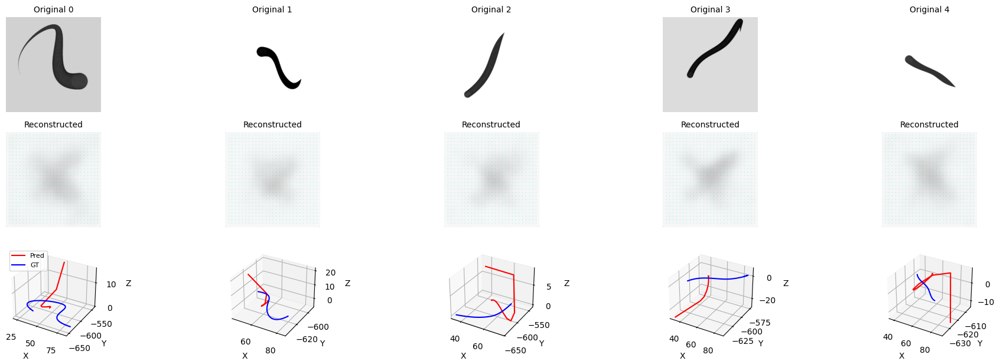

Epoch 19/200 [Val]: 100%|██████████| 8/8 [00:24<00:00,  3.04s/it]


Epoch 19/200: Train=10.9600, Val=10.8665 --> best model saved


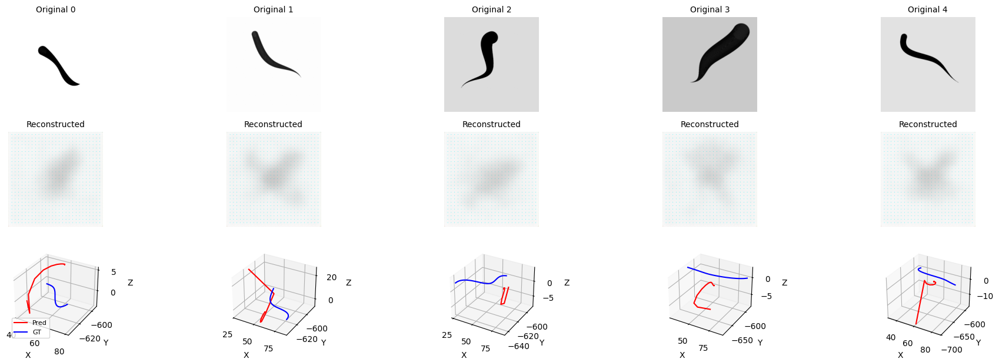

Epoch 20/200 [Val]: 100%|██████████| 8/8 [00:25<00:00,  3.17s/it]


Epoch 20/200: Train=10.7341, Val=10.6698 --> best model saved


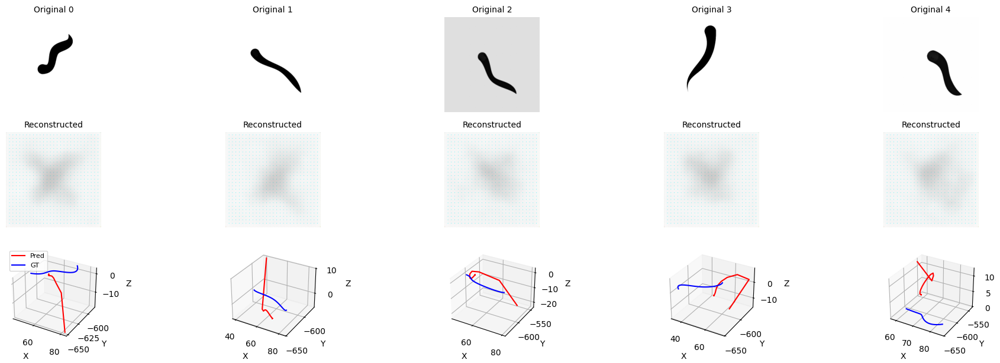

Epoch 21/200 [Val]: 100%|██████████| 8/8 [00:24<00:00,  3.08s/it]


Epoch 21/200: Train=10.5751, Val=10.5090 --> best model saved


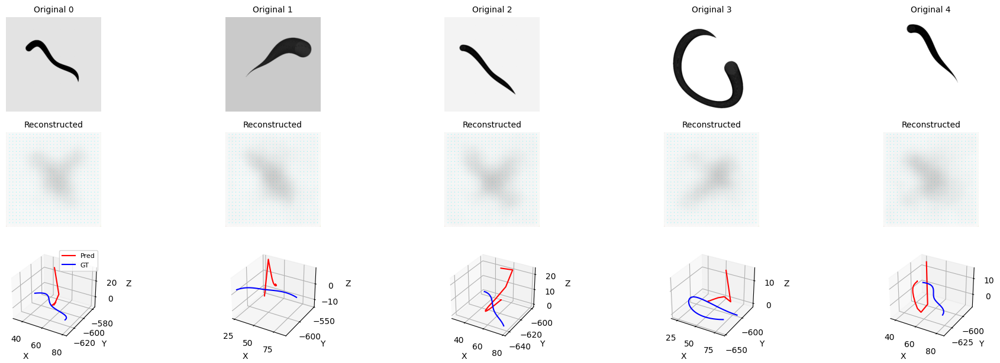

Epoch 22/200 [Val]: 100%|██████████| 8/8 [00:24<00:00,  3.11s/it]


Epoch 22/200: Train=10.3964, Val=10.3554 --> best model saved


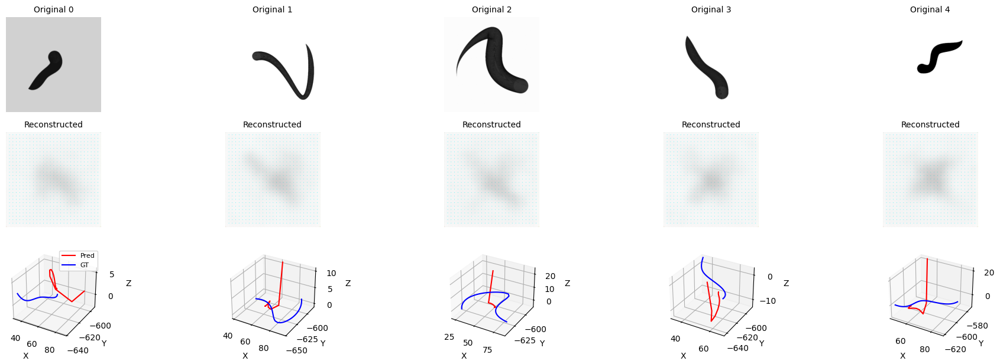

Epoch 23/200 [Val]: 100%|██████████| 8/8 [00:25<00:00,  3.18s/it]


Epoch 23/200: Train=10.2811, Val=10.1522 --> best model saved


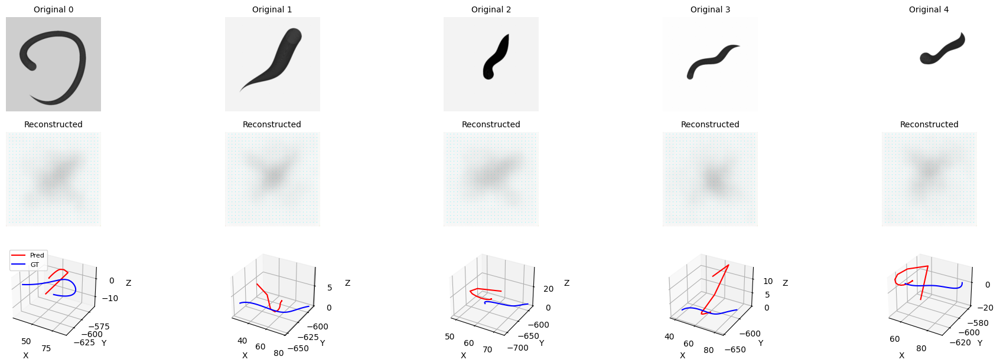

Epoch 24/200 [Val]: 100%|██████████| 8/8 [00:25<00:00,  3.15s/it]


Epoch 24/200: Train=10.1125, Val=10.0383 --> best model saved


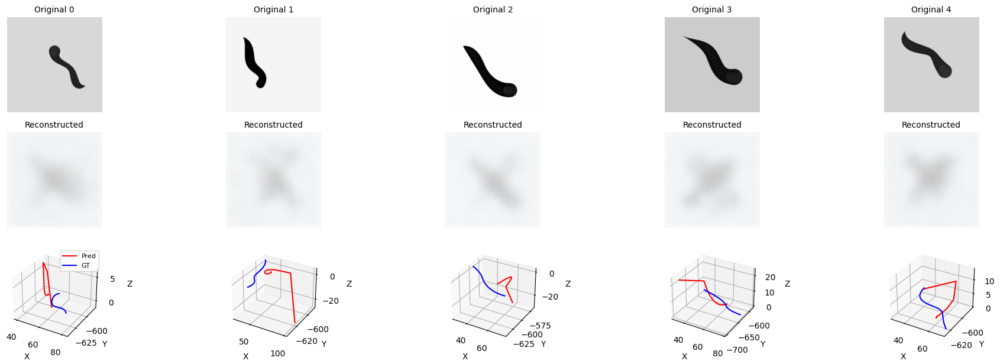

Epoch 25/200 [Val]: 100%|██████████| 8/8 [00:28<00:00,  3.53s/it]


Epoch 25/200: Train=9.9735, Val=9.8924 --> best model saved


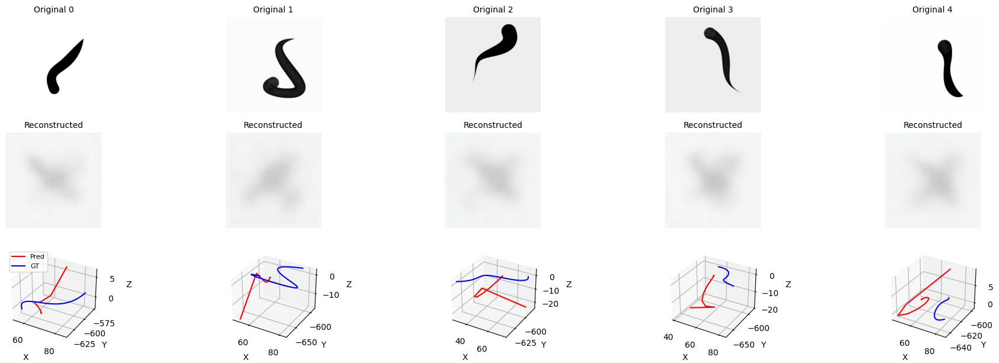

Epoch 26/200 [Val]: 100%|██████████| 8/8 [00:29<00:00,  3.63s/it]


Epoch 26/200: Train=9.8543, Val=9.7799 --> best model saved


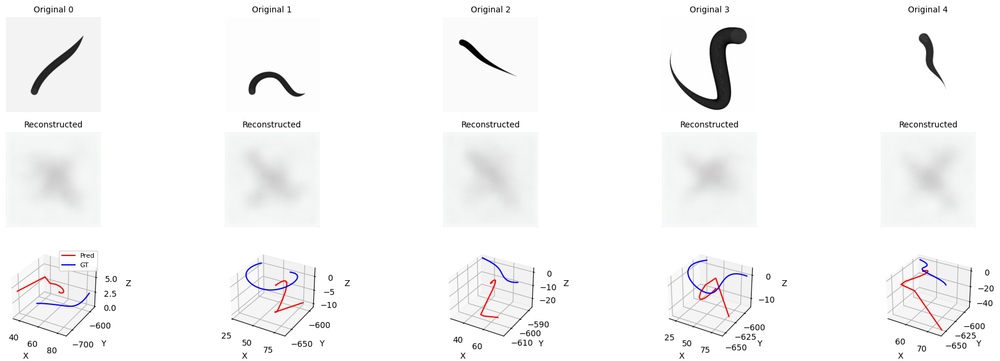

Epoch 27/200 [Val]: 100%|██████████| 8/8 [00:26<00:00,  3.37s/it]


Epoch 27/200: Train=9.7141, Val=9.6776 --> best model saved


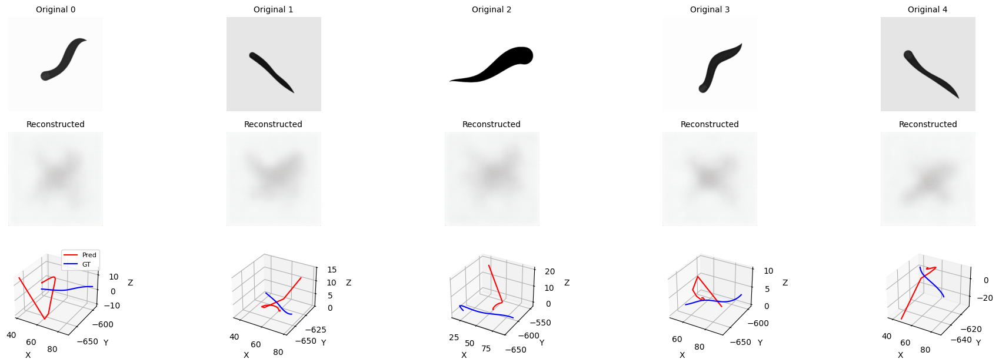

Epoch 28/200 [Val]: 100%|██████████| 8/8 [00:28<00:00,  3.58s/it]


Epoch 28/200: Train=9.6047, Val=9.5574 --> best model saved


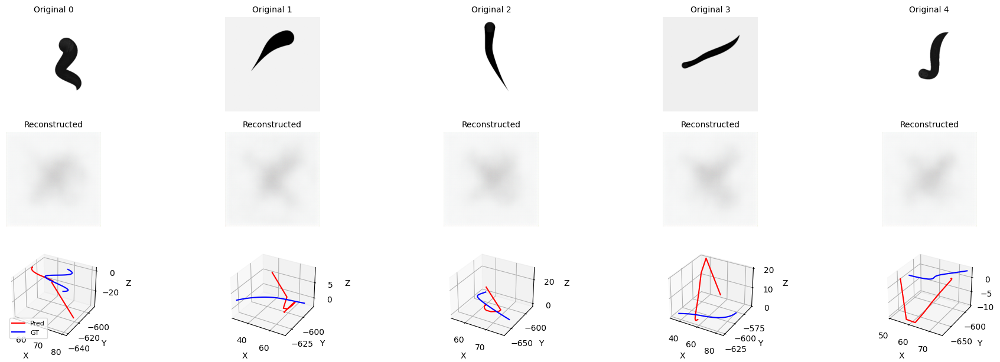

Epoch 29/200 [Val]: 100%|██████████| 8/8 [00:24<00:00,  3.04s/it]


Epoch 29/200: Train=9.5248, Val=9.5248 --> best model saved


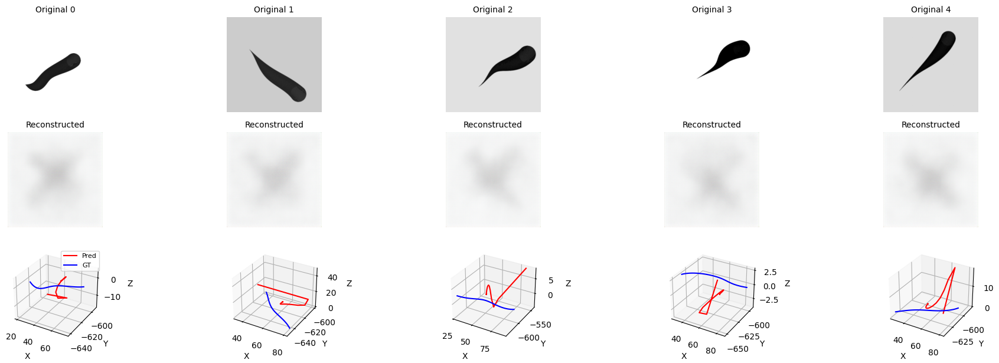

Epoch 30/200 [Val]: 100%|██████████| 8/8 [00:26<00:00,  3.25s/it]


Epoch 30/200: Train=9.4299, Val=9.3971 --> best model saved


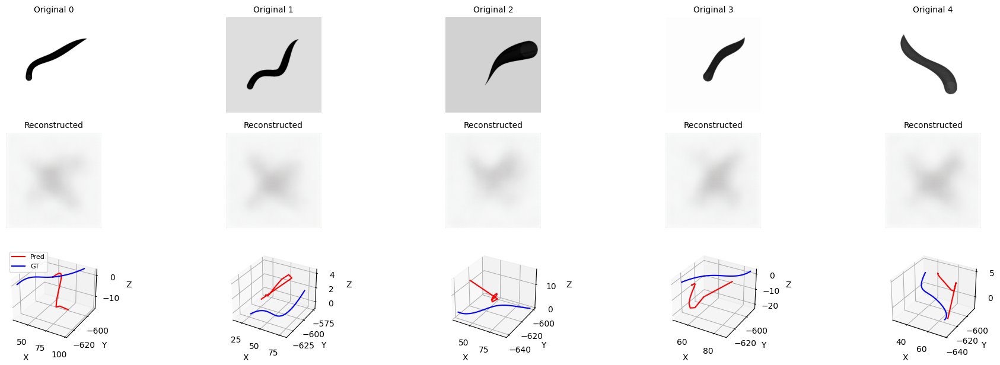

Epoch 31/200 [Val]: 100%|██████████| 8/8 [00:25<00:00,  3.21s/it]


Epoch 31/200: Train=9.3253, Val=9.2872 --> best model saved


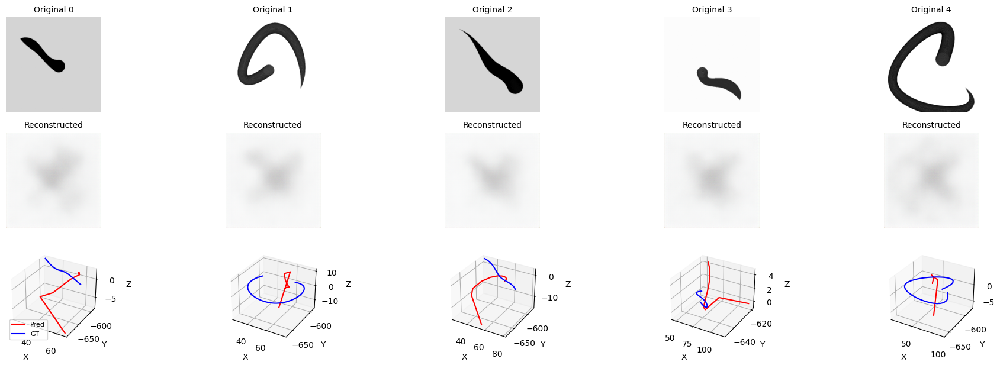

Epoch 32/200 [Val]: 100%|██████████| 8/8 [00:24<00:00,  3.03s/it]


Epoch 32/200: Train=9.2475, Val=9.2396 --> best model saved


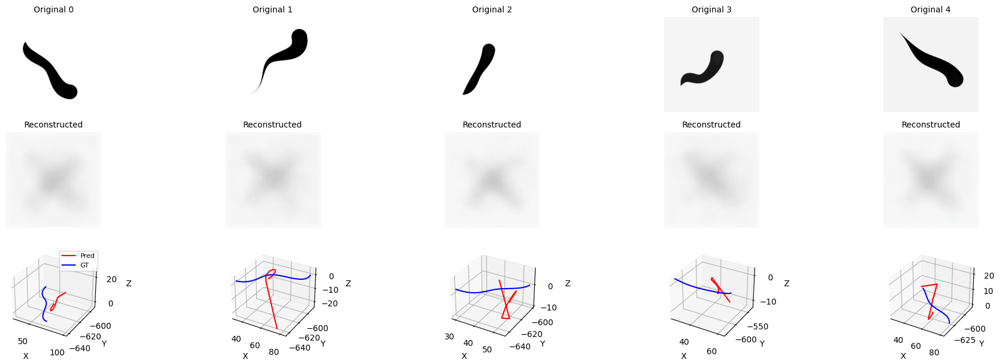

Epoch 33/200 [Val]: 100%|██████████| 8/8 [00:27<00:00,  3.48s/it]


Epoch 33/200: Train=9.1598, Val=9.1415 --> best model saved


In [ ]:
# Initialize loss tracking
train_losses, val_losses = [], []
train_img_losses, val_img_losses = [], []
train_mot_losses, val_mot_losses = [], []
train_kl_img_losses, val_kl_img_losses = [], []
train_kl_mot_losses, val_kl_mot_losses = [], []
train_kl_joint_losses, val_kl_joint_losses = [], []
train_smooth_losses, val_smooth_losses = [], []

best_val_loss = float('inf')
no_improve_epochs = 0
patience = 40

for epoch in range(config["num_epochs"]):
    # TRAIN PHASE
    model.train()
    epoch_train_loss = 0.0
    sum_img, sum_mot, sum_kl_img, sum_kl_mot, sum_kl_joint, sum_smooth = [0.0] * 6

    for images, motions, lengths in tqdm(train_loader, desc=f"Epoch {epoch+1}/{config['num_epochs']} [Train]"):
        images, motions, lengths = images.to(device), motions.to(device), lengths.to(device)

        # forward pass
        recon_img, recon_mot, mu_img, logvar_img, mu_mot, logvar_mot = model(images, motions, lengths)

        # compute multimodal VAE loss
        loss, loss_dict = vae_loss(
            recon_img, images, recon_mot, motions, lengths,
            mu_img, logvar_img, mu_mot, logvar_mot,
            criterion_img=nn.MSELoss(), criterion_mot=criterion, smooth_weight=0.1
        )

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        batch_size = images.size(0)
        epoch_train_loss += loss.item() * batch_size
        sum_img += loss_dict["recon_img"] * batch_size
        sum_mot += loss_dict["recon_mot"] * batch_size
        sum_kl_img += loss_dict["kl_img"] * batch_size
        sum_kl_mot += loss_dict["kl_mot"] * batch_size
        sum_kl_joint += loss_dict["kl_joint"] * batch_size
        sum_smooth += loss_dict["smooth"] * batch_size

    n_train = len(train_loader.dataset)
    epoch_train_loss /= n_train
    train_losses.append(epoch_train_loss)
    train_img_losses.append(sum_img / n_train)
    train_mot_losses.append(sum_mot / n_train)
    train_kl_img_losses.append(sum_kl_img / n_train)
    train_kl_mot_losses.append(sum_kl_mot / n_train)
    train_kl_joint_losses.append(sum_kl_joint / n_train)
    train_smooth_losses.append(sum_smooth / n_train)

    # VALIDATION PHASE
    model.eval()
    epoch_val_loss = 0.0
    sum_img = sum_mot = sum_kl_img = sum_kl_mot = sum_kl_joint = sum_smooth = 0.0

    with torch.no_grad():
        for images, motions, lengths in tqdm(val_loader, desc=f"Epoch {epoch+1}/{config['num_epochs']} [Val]"):
            images, motions, lengths = images.to(device), motions.to(device), lengths.to(device)

            recon_img, recon_mot, mu_img, logvar_img, mu_mot, logvar_mot = model(images, motions, lengths)
            loss, loss_dict = vae_loss(
                recon_img, images, recon_mot, motions, lengths,
                mu_img, logvar_img, mu_mot, logvar_mot,
                criterion_img=nn.MSELoss(), criterion_mot=criterion, smooth_weight=0.1
            )

            batch_size = images.size(0)
            epoch_val_loss += loss.item() * batch_size
            sum_img += loss_dict["recon_img"] * batch_size
            sum_mot += loss_dict["recon_mot"] * batch_size
            sum_kl_img += loss_dict["kl_img"] * batch_size
            sum_kl_mot += loss_dict["kl_mot"] * batch_size
            sum_kl_joint += loss_dict["kl_joint"] * batch_size
            sum_smooth += loss_dict["smooth"] * batch_size

    n_val = len(val_loader.dataset)
    epoch_val_loss /= n_val
    val_losses.append(epoch_val_loss)
    val_img_losses.append(sum_img / n_val)
    val_mot_losses.append(sum_mot / n_val)
    val_kl_img_losses.append(sum_kl_img / n_val)
    val_kl_mot_losses.append(sum_kl_mot / n_val)
    val_kl_joint_losses.append(sum_kl_joint / n_val)
    val_smooth_losses.append(sum_smooth / n_val)

    # EARLY STOPPING
    if epoch_val_loss < best_val_loss:
        best_val_loss = epoch_val_loss
        torch.save(model.state_dict(), "multimodal_vae_best_higherLR.pth")
        no_improve_epochs = 0
        print(f"Epoch {epoch+1}/{config['num_epochs']}: "
              f"Train={epoch_train_loss:.4f}, Val={epoch_val_loss:.4f} --> best model saved")
    else:
        no_improve_epochs += 1
        print(f"Epoch {epoch+1}/{config['num_epochs']}: "
              f"Train={epoch_train_loss:.4f}, Val={epoch_val_loss:.4f} "
              f"(no improvement {no_improve_epochs}/{patience})")

    if no_improve_epochs >= patience:
        print(f"Early stopping triggered at epoch {epoch+1}.")
        break

    # visualize a few reconstructions
    plot_reconstructions_mVAE(model, train_loader, epoch, device=device)


# SAVE ALL LOSSES FOR PLOTTING
loss_history = {
    "train_total": train_losses,
    "val_total": val_losses,
    "train_img": train_img_losses,
    "val_img": val_img_losses,
    "train_mot": train_mot_losses,
    "val_mot": val_mot_losses,
    "train_kl_img": train_kl_img_losses,
    "val_kl_img": val_kl_img_losses,
    "train_kl_mot": train_kl_mot_losses,
    "val_kl_mot": val_kl_mot_losses,
    "train_kl_joint": train_kl_joint_losses,
    "val_kl_joint": val_kl_joint_losses,
    "train_smooth": train_smooth_losses,
    "val_smooth": val_smooth_losses,
}


## Evaluation - Plot Loss

In [ ]:
model.load_state_dict(torch.load("multimodal_vae_best_higherLR.pth", map_location=device))

<All keys matched successfully>

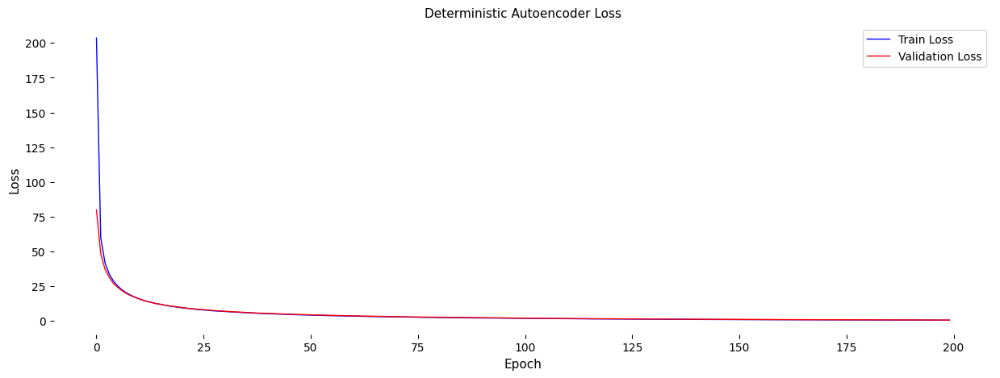

In [ ]:
import matplotlib.pyplot as plt

# Save ALL previously recorded losses
def save_all_losses(loss_history, filename='losses.txt'):
    with open(filename, 'w') as f:
        num_epochs = len(loss_history["train_total"])
        f.write("==== Multimodal VAE Training Loss Summary ====\n\n")

        # Header line
        f.write(f"{'Epoch':<6} | {'Train_Total':<12} {'Val_Total':<12} "
                f"{'Train_Img':<12} {'Val_Img':<12} "
                f"{'Train_Mot':<12} {'Val_Mot':<12} "
                f"{'KL_Img(T/V)':<20} {'KL_Mot(T/V)':<20} {'KL_Joint(T/V)':<20} "
                f"{'Smooth(T/V)':<20}\n")
        f.write("=" * 140 + "\n")

        # Write all epochs
        for i in range(num_epochs):
            f.write(f"{i+1:<6} | "
                    f"{loss_history['train_total'][i]:<12.6f} {loss_history['val_total'][i]:<12.6f} "
                    f"{loss_history['train_img'][i]:<12.6f} {loss_history['val_img'][i]:<12.6f} "
                    f"{loss_history['train_mot'][i]:<12.6f} {loss_history['val_mot'][i]:<12.6f} "
                    f"{loss_history['train_kl_img'][i]:<9.6f}/{loss_history['val_kl_img'][i]:<9.6f} "
                    f"{loss_history['train_kl_mot'][i]:<9.6f}/{loss_history['val_kl_mot'][i]:<9.6f} "
                    f"{loss_history['train_kl_joint'][i]:<9.6f}/{loss_history['val_kl_joint'][i]:<9.6f} "
                    f"{loss_history['train_smooth'][i]:<9.6f}/{loss_history['val_smooth'][i]:<9.6f}\n")

    print(f"All losses (from {num_epochs} epochs) saved to '{filename}'.")


# Plot all losses
def plot_all_losses(loss_history):
    plt.figure(figsize=(15, 5))
    
    components = [
        ("total", "Total Loss"),
        ("img", "Image Reconstruction Loss"),
        ("mot", "Motion Reconstruction Loss"),
        ("kl_img", "KL Divergence (Image)"),
        ("kl_mot", "KL Divergence (Motion)"),
        ("kl_joint", "KL Divergence (Joint)"),
        ("smooth", "Motion Smoothness Loss"),
    ]
    
    for i, (key, title) in enumerate(components, 1):
        plt.subplot(3, 3, i)
        plt.plot(loss_history[f"train_{key}"], 'b-', label='Train', linewidth=1)
        plt.plot(loss_history[f"val_{key}"], 'r-', label='Validation', linewidth=1)
        plt.title(title, fontsize=11)
        plt.xlabel("Epoch", fontsize=11)
        plt.ylabel("Loss", fontsize=11)
        ax = plt.gca()
        for spine in ax.spines.values():
            spine.set_visible(False)
        plt.legend(fontsize=8)
        plt.grid(alpha=0.2)

    plt.tight_layout()
    plt.show()


# Run the saving and plotting
save_all_losses(loss_history, 'losses.txt')
plot_all_losses(loss_history)

## Plot tSNE

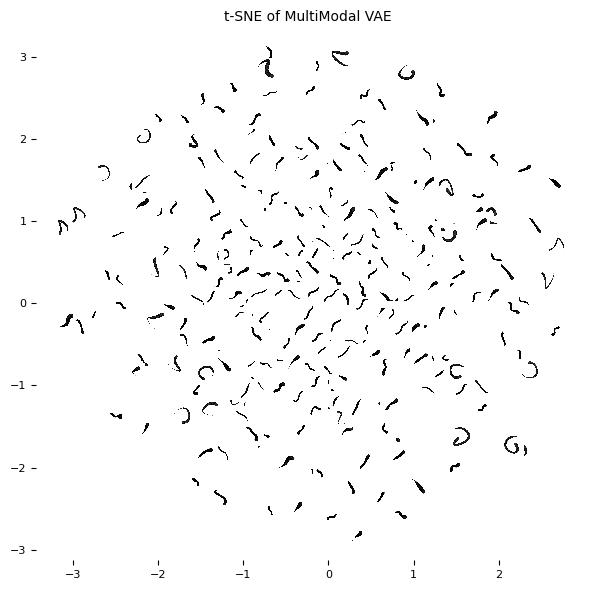

In [ ]:
import matplotlib.offsetbox as offsetbox
from sklearn.manifold import TSNE
import numpy as np
import torch
import matplotlib.pyplot as plt
from torchvision import transforms
from PIL import Image

def plot_tsne_brushstroke(model, dataset, device='cpu', max_samples=300, random_seed=42):
    """
    Visualize image encoder latent space using t-SNE, overlaying ORIGINAL (untransformed) thumbnails.
    """
    model.eval()
    np.random.seed(random_seed)

    # Random Selection
    idxs = np.random.choice(len(dataset), min(max_samples, len(dataset)), replace=False)

    images_list = []
    latents_list = []

    with torch.no_grad():
        for idx in idxs:
            # Get original image
            if hasattr(dataset, "get_original_image"):
                orig_img = dataset.get_original_image(idx)
            else:
                path = dataset.image_paths[idx] if hasattr(dataset, "image_paths") else dataset.img_paths[idx]
                orig_img = Image.open(path).convert("RGB")

            # image for model prediction
            data = dataset[idx]
            if isinstance(data, (tuple, list)):
                img = data[0]
            else:
                img = data

            # ensure it's tensor
            if not isinstance(img, torch.Tensor):
                img_tensor = transforms.ToTensor()(img).unsqueeze(0).to(device)
            else:
                img_tensor = img.unsqueeze(0).to(device)

            # if there is .img_enc(), otherwise use encoder
            if hasattr(model, "img_enc"):
                _, mu, _ = model.img_enc(img_tensor)
            else:
                if hasattr(model, "encode"):
                    mu = model.encode(img_tensor)
                else:
                    mu = model(img_tensor)
            
            latents_list.append(mu.cpu().numpy().squeeze())
            images_list.append(np.array(orig_img))

    latents = np.stack(latents_list)

    tsne = TSNE(n_components=2, random_state=random_seed, perplexity=30)
    latents_2d = tsne.fit_transform(latents)

    # Draw the plot
    fig, ax = plt.subplots(figsize=(6,6))
    ax.scatter(latents_2d[:,0], latents_2d[:,1], alpha=0)

    for xy, img in zip(latents_2d, images_list):
        imagebox = offsetbox.AnnotationBbox(
            offsetbox.OffsetImage(img, zoom=0.03),  # Adjust the size
            xy,
            frameon=False
        )
        ax.add_artist(imagebox)

    for spine in ax.spines.values():
        spine.set_visible(False)

    ax.tick_params(labelsize=8)
    ax.set_title("t-SNE of MultiModal VAE", fontsize=10)
    
    for spine in ax.spines.values():
        spine.set_visible(False)
    ax.tick_params(labelsize=8)

    plt.tight_layout()
    plt.show()

# Image latent
plot_tsne_brushstroke(model, dataset, device=device, max_samples=300)

## Prediction Evaluation

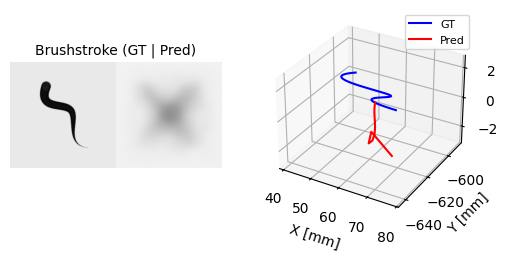

In [ ]:
import os
import pandas as pd
import matplotlib.pyplot as plt

def visualize_mVAE_reconstructions(model, dataloader, save_dir="mvae_results", device='cpu', max_samples=1):
    os.makedirs(save_dir, exist_ok=True)
    model.eval()
    
    with torch.no_grad():
        images, motions, lengths = next(iter(dataloader))
        images, motions = images.to(device), motions.to(device)
        
        # forward pass: return reconstructed images & motions
        recon_img, recon_mot, mu_img, logvar_img, mu_mot, logvar_mot = model(images, motions, lengths)
        
        num_samples = min(max_samples, images.size(0))
        fig = plt.figure(figsize=(6, 3))
        
        for i in range(num_samples):
            T = lengths[i].item()

            # Convert to numpy
            pred_xyz = recon_mot[i, :T, :].cpu().numpy()*1000
            gt_xyz = motions[i, :T, :].cpu().numpy()*1000
            pred_img = recon_img[i].cpu().permute(1,2,0).numpy()
            gt_img = images[i].cpu().permute(1,2,0).numpy()

            # Save CSV
            pred_df = pd.DataFrame(pred_xyz, columns=["X_mm","Y_mm","Z_mm"])
            gt_df = pd.DataFrame(gt_xyz, columns=["X_mm","Y_mm","Z_mm"])
            pred_path = os.path.join(save_dir, f"pred_{i}.csv")
            gt_path = os.path.join(save_dir, f"gt_{i}.csv")
            pred_df.to_csv(pred_path, index=False)
            gt_df.to_csv(gt_path, index=False)

            # Draw the plot
            ax_img = fig.add_subplot(num_samples, 2, 2 * i + 1)
            ax_img.imshow(np.clip(np.concatenate([gt_img, pred_img], axis=1), 0, 1))
            ax_img.axis('off')
            ax_img.set_title(f"Brushstroke (GT | Pred)", fontsize=10)

            ax_3d = fig.add_subplot(num_samples, 2, 2 * i + 2, projection='3d')
            ax_3d.plot(gt_xyz[:, 0], gt_xyz[:, 1], gt_xyz[:, 2], 'b', label='GT')
            ax_3d.plot(pred_xyz[:, 0], pred_xyz[:, 1], pred_xyz[:, 2], 'r', label='Pred')
            ax_3d.set_xlabel('X [mm]')
            ax_3d.set_ylabel('Y [mm]')
            ax_3d.set_zlabel('Z [mm]')
            ax_3d.view_init(elev=30, azim=-60)
            if i == 0:
                ax_3d.legend(fontsize=8)

        plt.savefig('pred_mVAE', bbox_inches='tight', pad_inches=0.3)
        plt.show()

visualize_mVAE_reconstructions(model, train_loader, device=device)